# Библиотеки

In [ ]:
import os
os.environ['OPENBLAS_NUM_THREADS'] = '1' # фикс предупреждения OpenBLAS при использовании модели, на производительность не влияет

In [51]:
from abc import ABC, abstractmethod
from typing import Dict, List



import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
import pandas as pd
import pickle
from implicit.als import AlternatingLeastSquares
from implicit.evaluation import precision_at_k, mean_average_precision_at_k
from scipy.sparse import csr_matrix
from sklearn.preprocessing import LabelEncoder
from tqdm.auto import tqdm

# Данные

In [52]:
data_folder = "./"

users_df = pd.read_csv(data_folder + "users_df.csv")
items_df = pd.read_csv(data_folder + "items_df.csv")

countries = pd.read_csv(data_folder + "countries.csv")
genres = pd.read_csv(data_folder + "genres.csv")
staff = pd.read_csv(data_folder + "staff.csv")

train_part = pd.read_csv(data_folder + "train_data.csv", parse_dates=["datetime"])
test_part = pd.read_csv(data_folder + "test_data.csv")
test_part = test_part.groupby("user_id").agg({"movie_id": list}).reset_index()


# Обработаем данные

In [53]:
print(f"Число тренировочных интеракций: {len(train_part):,}")
train_part.head()

Число тренировочных интеракций: 1,251,871


,id,datetime,user_id,movie_id,duration,is_train
0,0,2023-04-06 15:00:00.071114+03:00,10250,427.0,485.0,True
1,1,2023-04-06 15:00:01.123928+03:00,2062,1521.0,129.0,True
2,2,2023-04-06 15:00:03.957246+03:00,12980,4598.0,2795.0,True
3,3,2023-04-06 15:00:04.990565+03:00,30646,5324.0,5094.0,True
4,4,2023-04-06 15:00:10.495017+03:00,43069,4291.0,75.0,True


#### Проверим данные на полноту информации

In [54]:
train_part.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1251871 entries, 0 to 1251870
Data columns (total 6 columns):
 #   Column    Non-Null Count    Dtype  
---  ------    --------------    -----  
 0   id        1251871 non-null  int64  
 1   datetime  1251871 non-null  object 
 2   user_id   1251871 non-null  int64  
 3   movie_id  1251871 non-null  float64
 4   duration  1251871 non-null  float64
 5   is_train  1251871 non-null  bool   
dtypes: bool(1), float64(2), int64(2), object(1)
memory usage: 48.9+ MB


In [55]:
train_part.isna().sum()

id          0
datetime    0
user_id     0
movie_id    0
duration    0
is_train    0
dtype: int64

In [56]:
train_part.isnull().sum()

id          0
datetime    0
user_id     0
movie_id    0
duration    0
is_train    0
dtype: int64

#### Поработаем с колонкой movie_id. Посмотрим на количество уникальных фильмов и их просмотры

In [57]:
movie_views = train_part[['movie_id','user_id']].groupby('movie_id')['user_id'].agg('count').to_frame()
movie_views.rename(columns={'user_id':'views'}, inplace= True)
movie_views

,views
movie_id,
0.0,20
3.0,3
4.0,78
5.0,194
6.0,4
...,...
7419.0,3
7422.0,233
7423.0,126


In [58]:
movie_views.describe()

,views
count,5269.000000
mean,237.591763
std,498.162580
min,1.000000
25%,21.000000
50%,82.000000
75%,253.000000
max,17053.000000


#### Выше видим, что количество просмотренных фильмов не совпадает с общим количеством фильмов из items_df.csv , так что это нужно будет учесть в дальнейшем

#### Посмотрим, как обстоят дела с колонкой duration

In [59]:
px.histogram(train_part, x='duration', title='Распределение по длительности').show()

#### Отсюда можно сделать вывод, что перевес есть у людей, который смотрели фильмы от 0 до 49 минут и от 50 до 99 минут. Немного поработаем с этой информацией в надежде получить нечто интересное


#### Ниже будем пробовать работать с медианными данными по длительности просмотра, то есть выборку отчистим от всего, что ниже 25% и выше 75%, иначе говоря избавимся от ненужных нам выбросов

In [60]:
# Добавим столбец просмотров фильма к каждому пользователю, который этот фильм смотрит
train_duration = train_part.copy()
train_duration = train_duration.merge(movie_views, on='movie_id', how='left')
train_duration.head()

,id,datetime,user_id,movie_id,duration,is_train,views
0,0,2023-04-06 15:00:00.071114+03:00,10250,427.0,485.0,True,189
1,1,2023-04-06 15:00:01.123928+03:00,2062,1521.0,129.0,True,3477
2,2,2023-04-06 15:00:03.957246+03:00,12980,4598.0,2795.0,True,833
3,3,2023-04-06 15:00:04.990565+03:00,30646,5324.0,5094.0,True,311
4,4,2023-04-06 15:00:10.495017+03:00,43069,4291.0,75.0,True,713


In [61]:
# Отбросим 25% фильмов, у которых меньшее количество просмотров
train_duration = train_duration[train_duration['views'] > 21]

In [62]:
train_duration.describe()

,id,user_id,movie_id,duration,views
count,1.239474e+06,1.239474e+06,1.239474e+06,1.239474e+06,1.239474e+06
mean,9.087296e+05,4.253082e+04,3.696612e+03,2.810352e+03,1.294591e+03
std,5.882096e+05,5.532037e+04,2.129318e+03,2.738566e+03,2.170071e+03
min,0.000000e+00,0.000000e+00,4.000000e+00,1.000000e+00,2.200000e+01
25%,4.122152e+05,5.957000e+03,1.873000e+03,2.050000e+02,3.020000e+02
50%,8.669800e+05,1.967300e+04,3.672000e+03,1.892000e+03,6.980000e+02
75%,1.339347e+06,5.525300e+04,5.584000e+03,5.191000e+03,1.517000e+03
max,2.477903e+06,2.638740e+05,7.426000e+03,4.573800e+04,1.705300e+04


In [63]:
# Продолжаем чиститку от 25% и 75%
train_duration = train_duration[(train_duration['duration'] >= 205) & (train_duration['duration'] <= 5191)]

In [64]:
train_duration.info()

<class 'pandas.core.frame.DataFrame'>
Index: 620277 entries, 0 to 1251870
Data columns (total 7 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   id        620277 non-null  int64  
 1   datetime  620277 non-null  object 
 2   user_id   620277 non-null  int64  
 3   movie_id  620277 non-null  float64
 4   duration  620277 non-null  float64
 5   is_train  620277 non-null  bool   
 6   views     620277 non-null  int64  
dtypes: bool(1), float64(2), int64(3), object(1)
memory usage: 33.7+ MB


#### Итого имеем датасет train_duration без выбросов по просмотрам в целом и по длительности просмотра
#### Теперь займемся обработкой по пользователям

In [65]:
user_watched_films = train_part[['movie_id','user_id']].groupby('user_id')['movie_id'].agg('count').to_frame()
user_watched_films.rename(columns={'movie_id':'watched_films_number'}, inplace= True)
user_watched_films.head()

,watched_films_number
user_id,
0,70
1,118
2,118
3,99
4,414


In [66]:
user_watched_films.describe()

,watched_films_number
count,207377.000000
mean,6.036692
std,12.294655
min,1.000000
25%,1.000000
50%,2.000000
75%,5.000000
max,782.000000


#### Вот здесь уже появляется интересный и в то же время важный момент. Оказывается, тренировочные данные у нас несбалансированные и лишь 25% верхних процентов посмотрели хотя бы пять фильмов, а мы ведь наше желание — рекомендовать аж 10. Рекомендовать людям фильмы на основе просмотренных 1 или 2 фильмов дело объективно очень неточное. 

## Так что здесь придется прибегнуть к еще одной идее по модификации модели — "плохим" пользователям, то есть людям, у которых бедная история просмотра, стоит рекомендовать фильмы из топа, чтобы увеличить количество просмотренных фильмов



#### Посмотрим, как обстоят дела с жанрами и их просмотрами

In [67]:
df = movie_views.copy()

In [68]:
# Объединяем информацию по каждому фильму с уже сделанным выше датасетом просмотров
df = df.merge(sliced_items, on='movie_id', how='left')
df.head()

,movie_id,views,genres,year
0,0.0,20,[97],2022-01-01
1,3.0,3,"[97, 303, 143, 319]",2017-01-01
2,4.0,78,"[138, 97]",2015-01-01
3,5.0,194,[234],2012-01-01
4,6.0,4,[320],2021-01-01


In [69]:
df1 = df.copy()
# Разбиваем список жанров в фильмах на отдельные позиции
df1['genres'] = df1['genres'].apply(lambda x: list(x[1:-1].split(sep = ',')))
df1 = df1.explode("genres")
df1.head()

,movie_id,views,genres,year
0,0.0,20,97,2022-01-01
1,3.0,3,97,2017-01-01
1,3.0,3,303,2017-01-01
1,3.0,3,143,2017-01-01
1,3.0,3,319,2017-01-01


In [70]:
# Сортируем убыванию просмотров в каждом жанре
df2 = df1.sort_values(['genres','views'],ascending=False)
df2.head()

,movie_id,views,genres,year
4374,6194.0,6853,97,2023-01-01
1863,2679.0,4789,97,2021-01-01
4143,5876.0,4455,97,2022-01-01
3768,5336.0,4434,97,2022-01-01
1721,2480.0,4084,97,2009-01-01


In [71]:
# Берем топ 10 просмотров каждого жанра
top_10_per_genre = df2.groupby('genres').head(10)
# Убедимся визуально, что все сделали верно
top_10_per_genre.head(20)

,movie_id,views,genres,year
4374,6194.0,6853,97,2023-01-01
1863,2679.0,4789,97,2021-01-01
4143,5876.0,4455,97,2022-01-01
3768,5336.0,4434,97,2022-01-01
1721,2480.0,4084,97,2009-01-01
885,1281.0,3930,97,2021-01-01
2017,2893.0,3247,97,2022-01-01
3048,4314.0,3230,97,2021-01-01
1142,1646.0,2552,97,2019-01-01
4033,5717.0,2380,97,2021-01-01


#### Теперь почистим от "плохих" пользователей данные 

In [72]:
# Поработаем с жанрами и годами фильмов
sliced_items = items_df[["id", "genres", "year"]]
# Переименование, потому что в дальнейшем добавим эти столбцы в тренировочную выборку
sliced_items.rename(columns={'id':'movie_id'}, inplace= True)
sliced_items.head()

/tmp/ipykernel_121039/2738397760.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,movie_id,genres,year
0,0,[97],2022-01-01
1,1,"[138, 97, 294]",2010-01-01
2,2,"[294, 302]",2010-01-01
3,3,"[97, 303, 143, 319]",2017-01-01
4,4,"[138, 97]",2015-01-01


In [73]:
reworked_train = train_duration.copy()
reworked_train.head()

,id,datetime,user_id,movie_id,duration,is_train,views
0,0,2023-04-06 15:00:00.071114+03:00,10250,427.0,485.0,True,189
2,2,2023-04-06 15:00:03.957246+03:00,12980,4598.0,2795.0,True,833
3,3,2023-04-06 15:00:04.990565+03:00,30646,5324.0,5094.0,True,311
6,6,2023-04-06 15:00:12.927035+03:00,15060,3316.0,260.0,True,1690
7,7,2023-04-06 15:00:13.580970+03:00,38702,1390.0,400.0,True,396


In [74]:
reworked_train = reworked_train.merge(sliced_items, on='movie_id', how='left')
reworked_train.head()

,id,datetime,user_id,movie_id,duration,is_train,views,genres,year
0,0,2023-04-06 15:00:00.071114+03:00,10250,427.0,485.0,True,189,[97],2021-01-01
1,2,2023-04-06 15:00:03.957246+03:00,12980,4598.0,2795.0,True,833,[261],2006-01-01
2,3,2023-04-06 15:00:04.990565+03:00,30646,5324.0,5094.0,True,311,"[138, 97, 302]",1998-01-01
3,6,2023-04-06 15:00:12.927035+03:00,15060,3316.0,260.0,True,1690,"[97, 303, 266, 326]",2021-01-01
4,7,2023-04-06 15:00:13.580970+03:00,38702,1390.0,400.0,True,396,"[97, 124]",2021-01-01


In [75]:
reworked_train['datetime'] = pd.to_datetime(reworked_train['datetime']).dt.year
reworked_train['year'] = pd.to_datetime(reworked_train['year']).dt.year
reworked_train['movie_id'] = reworked_train['movie_id'].astype(int)
reworked_train

,id,datetime,user_id,movie_id,duration,is_train,views,genres,year
0,0,2023,10250,427,485.0,True,189,[97],2021
1,2,2023,12980,4598,2795.0,True,833,[261],2006
2,3,2023,30646,5324,5094.0,True,311,"[138, 97, 302]",1998
3,6,2023,15060,3316,260.0,True,1690,"[97, 303, 266, 326]",2021
4,7,2023,38702,1390,400.0,True,396,"[97, 124]",2021
...,...,...,...,...,...,...,...,...,...
620272,2477876,2023,31874,7367,770.0,True,95,"[303, 326, 223]",2014
620273,2477879,2023,74122,1847,2908.0,True,325,[304],2019
620274,2477890,2023,112950,2784,345.0,True,42,[294],2020
620275,2477898,2023,34303,1520,2021.0,True,93,[127],2014


#### Шаг за шагом собрали отшлифованную выборку, на основе которой и будем тренировать модель

In [76]:
reworked_train.describe()

,id,datetime,user_id,movie_id,duration,views,year
count,6.202770e+05,620277.0,620277.000000,620277.000000,620277.000000,620277.000000,620277.000000
mean,9.007673e+05,2023.0,39545.134463,3692.096668,2283.649598,1237.268037,2009.364179
std,5.882463e+05,0.0,51460.122359,2121.149786,1651.209531,1961.390504,14.905743
min,0.000000e+00,2023.0,0.000000,4.000000,205.000000,22.000000,1925.000000
25%,4.004590e+05,2023.0,5699.000000,1868.000000,749.000000,301.000000,2005.000000
50%,8.562840e+05,2023.0,18768.000000,3673.000000,1890.000000,702.000000,2014.000000
75%,1.336311e+06,2023.0,51602.000000,5571.000000,3859.000000,1517.000000,2019.000000
max,2.477903e+06,2023.0,263868.000000,7426.000000,5191.000000,17053.000000,2023.000000


#### Поскольку после обработки datetime == 2023 у всех, то использовать этот параметр при тренировке нецелесообразно в дальнейшем, а по изначальному парамтру без обработки тяжело оценить степень влияния по времени, разве что полагать, что при наличии детей просмотр ранним утром означает рекомендацию мультиков...

#### Мы убрали из выборки "плохих" пользователей, оставив только "хороших", к которым будем применять нашу модель.

# Метрики

In [77]:
# ACHTUNG! DO NOT TOUCH 

def ndcg_metric(gt_items: np.ndarray, predicted: np.ndarray) -> float:
    at = len(predicted)
    relevance = np.array([1 if x in predicted else 0 for x in gt_items])
    # DCG uses the relevance of the recommended items
    rank_dcg = dcg(relevance)
    if rank_dcg == 0.0:
        return 0.0

    # IDCG has all relevances to 1 (or the values provided), up to the number of items in the test set that can fit in the list length
    ideal_dcg = dcg(np.sort(relevance)[::-1][:at])

    if ideal_dcg == 0.0:
        return 0.0

    ndcg_ = rank_dcg / ideal_dcg

    return ndcg_


def dcg(scores: np.ndarray) -> float:
    return np.sum(
        np.divide(np.power(2, scores) - 1, np.log2(np.arange(scores.shape[0], dtype=np.float64) + 2)), dtype=np.float64
    )


def recall_metric(gt_items: np.ndarray, predicted: np.ndarray) -> float:
    n_gt = len(gt_items)
    intersection = len(set(gt_items).intersection(set(predicted)))
    return intersection / n_gt


def evaluate_recommender(df: pd.DataFrame, model_preds_col: str, gt_col: str = "movie_id") -> Dict[str, float]:
    metric_values = []

    for _, row in df.iterrows():
        metric_values.append(
            (ndcg_metric(row[gt_col], row[model_preds_col]), recall_metric(row[gt_col], row[model_preds_col]))
        )

    return {"ndcg": np.mean([x[0] for x in metric_values]), "recall": np.mean([x[1] for x in metric_values])}

#### Класс, от которого стоит наследовать все ваши модели, чтобы эксперименты было проще проводить

In [78]:
class BaseRecommender(ABC):
    def __init__(self):
        self.trained = False

    @abstractmethod
    def fit(self, df: pd.DataFrame) -> None:
        # реализация может быть любой, никаких ограничений
    
        # не забудьте про
        self.trained = True

    @abstractmethod
    def predict(self, df: pd.DataFrame, topn: int = 10) -> List[np.ndarray]:
        # реализация может быть любой, НО
        # должен возвращать список массивов из movie_id, которые есть в `item_df`, чтобы корректно работал подсчет метрик
        pass

Раз уж у нас данные из неявных взаимодействий, то появилась мысль затюнить ALS из примера, чтобы работать с confidence matrix и параметром, отвечающим за вес (не)нужных нам взаимодействий.

$C_{ij} = 1 + \alpha \times R_{ij},$ \
где $\alpha - $ гиперпараметр, который отвечает за важность каждого взаимодействия \
$ R_{ij} - $ изначальная матрица взаимодействия
 
 Далее были учтены веса для набо жанров через бинарное представление (с весом $\frac{\alpha}{10}$) и для годов производства по приницу: новинки смотрятся в первую очередь (с весом $\frac{\alpha}{100}$), а общий вес считается как произведение этих двух.

 К тому же, учтем, что для "плохих" пользователей рекомендуем самые популярные, а для хороших нашу модифицированную модель

In [79]:
class TopPopular(BaseRecommender):
    def __init__(self):
        super().__init__()

    def fit(self, df: pd.DataFrame, item_id_col: str = "movie_id") -> None:
        # считаем популярность айтемов
        self.recommendations = df[item_id_col].value_counts().index.values
        self.trained = True

    def predict(self, df: pd.DataFrame, topn: int = 10) -> np.ndarray:
        assert self.trained
        # возвращаем для всех одно и то же
        return [self.recommendations[:topn]]


In [80]:
class ImplicitALS(BaseRecommender):
    def __init__(self, factors: int = 100, regularization: float = 0.01, alpha: float = 1.0, iterations: int = 1, **kwargs) -> None:
        super().__init__()
        self.model = AlternatingLeastSquares(
            factors=factors, regularization=regularization, alpha = 76.0, iterations=iterations, **kwargs
        )
        self.alpha = alpha  # Параметр alpha для взвешивания confidence matrix, по умолчанию ставим 1.0
        self.trained = False

    def _calculate_item_features(self, item_df: pd.DataFrame, item_ids: np.ndarray) -> pd.DataFrame:
        """
        Извлекает год и жанры для каждого фильма из item_df и фильтрует по item_ids (фильмы, которые смотрели пользователи).
        Создается бинарное представление всех жанров.
        Возвращает датафрейм с годом и бинарными представлениями жанров.
        """
        # Извлекаем только нужные фильмы, ведь есть те, которые зрители не смотрели.
        # Если это не учесть, то необходимые для умножения размеры матриц будут различными.
        item_features = item_df[item_df['id'].isin(item_ids)].copy()

        # Преобразуем дату в год
        item_features['year'] = pd.to_datetime(item_features['year'], errors='coerce').dt.year

        # Создаем список уникальных жанров для многомерного кодирования
        unique_genres = set()
        item_features['genres_list'] = item_features['genres'].apply(lambda x: [int(g) for g in x.strip('[]').split(',') if g.strip().isdigit()])
        for genres in item_features['genres_list']:
            unique_genres.update(genres)
        
        # Сортируем для единообразия
        unique_genres = sorted(unique_genres)  

        # Создаем бинарное представление жанров
        for genre in unique_genres:
            item_features[f'genre_{genre}'] = item_features['genres_list'].apply(lambda x: 1 if genre in x else 0)

        # Возвращаем датафрейм с годом и бинарными представлениями жанров
        genre_columns = [f'genre_{genre}' for genre in unique_genres]
        return item_features[['id', 'year'] + genre_columns]

    def _apply_item_weights(self, interaction_matrix: csr_matrix, item_features: pd.DataFrame, item_ids: np.ndarray) -> csr_matrix:
        """
        Корректирует веса в interaction_matrix на основе года и жанров фильмов.
        Для фильмов с несколькими жанрами вес рассчитывается как средний по жанрам.
        Возвращает матрицу с учетом весов жанра + года выпуска.
        """
        # Нормализуем год для применения весов
        current_year = pd.Timestamp.now().year
        
        # Применяем веса для фильмов
        for idx, item_id in enumerate(item_ids):
            if idx >= interaction_matrix.shape[1]:
                # Если индекс фильма выходит за пределы количества столбцов в interaction_matrix, пропускаем
                continue

            # Получаем данные о фильме (год и жанры)
            movie_features = item_features[item_features['id'] == item_id]
            if movie_features.empty:
                continue

            year = movie_features['year'].values[0]

            # Рассчитываем вес для года (чем новее фильм, тем больше вес) с учетом alpha / 100
            year_weight = 1 + (current_year - year) * self.alpha / 100

            # Рассчитываем средний вес по жанрам
            genre_columns = [col for col in movie_features.columns if col.startswith('genre_')]
            genre_weights = movie_features[genre_columns].values[0]

            # Усредненный вес по жанрам, тоже с учетом alpha / 10 как доверительного коэффициента
            average_genre_weight = 1 + (np.mean(genre_weights) * self.alpha / 10)  

            # Общий вес
            total_weight = year_weight * average_genre_weight

            # Применяем общий вес к строке матрицы, соответствующей данному item_id
            interaction_matrix[:, idx] = interaction_matrix[:, idx].multiply(total_weight)

        return interaction_matrix


    def fit(self, df: pd.DataFrame, item_df: pd.DataFrame, item_col: str = "movie_id", user_col: str = "user_id", value_col: str = None) -> None:
        """
        Подготовка данных и обучение модели на неявных данных.
        df - взаимодействия пользователей с фильмами.
        item_df - информация о фильмах (жанры и год производства).
        value_col: значение взаимодействия, если None, то использовать бинарное взаимодействие.
        """

        self.user_encoder = LabelEncoder()
        self.item_encoder = LabelEncoder()

        # Преобразуем пользователей и фильмы в числовые id
        user_ids = self.user_encoder.fit_transform(df[user_col])
        item_ids = self.item_encoder.fit_transform(df[item_col])

        if value_col is None:
            counts = np.ones(len(df))
        else:
            counts = df[value_col].values
        
        # Создаем interaction matrix (пользователь, фильм) с количеством взаимодействий
        matrix_shape = (len(self.user_encoder.classes_), len(self.item_encoder.classes_))
        interaction_matrix = csr_matrix((counts, (user_ids, item_ids)), shape=matrix_shape)

        # Добавляем alpha в веса матрицы взаимодействий
        interaction_matrix = interaction_matrix.multiply(self.alpha)

        # считаем, что взаимодействия, где нулевые значения(нет активности), уже учтены как значения, к которым вес не добавляем
        # (к разреженной матрице единицу пробемно добавить, потому что разреженность нарушается)
        interaction_matrix.data += 1 # Добавляем 1 только к ненулевым элементам

          #######
#         # по поводу комментария про добавление единицы
#         # пробовал 
#         # identity_matrix = csr_matrix(np.ones(interaction_matrix.shape))- создаем единичную разреженную матрицу размеров interaction_matrix
#         # self.confidence_matrix = (identity_matrix + interaction_matrix.multiply(self.alpha)).astype("double")
#         # но при запуске ячейки с подсчетом метрик мгновенно падало ядро, поэтому предполагаем по итогу без единицы на нулевых случаях 
          #######




        # Извлекаем фичи для фильмов, которые взаимодействовали с пользователями
        item_features = self._calculate_item_features(item_df, item_ids)

        # Применяем веса на основе года и жанра
        weight_interaction_matrix = self._apply_item_weights(interaction_matrix, item_features, item_ids)
        
        # Обучаем модель на скорректированной confidence_matrix
        self.confidence_matrix = weight_interaction_matrix
        self.model.fit(self.confidence_matrix)
        self.trained = True

    def predict(self, df: pd.DataFrame, nice_users: pd.DataFrame, topn: int = 10) -> List[np.ndarray]:
        """
        Предсказание фильмов для "хорошего" пользователя по функции recommend нашей модели,
        а для "плохого" по TopPopular

        Возвращает список topn фильмов.
        """
        assert self.trained

        all_recs = []

        # Поделим пользователей на "хороших" и "плохих"
        df_filtered = df[df['user_id'].isin(nice_users['user_id'])]
        df_remaining = df[~df['user_id'].isin(df_filtered['user_id'])]

        # Лучшие фильмы смотрим по полной изначальной выборке
        toppop = TopPopular()
        toppop.fit(train_part)

        # Генерируем рекомендации для каждого "хорошего" пользователя
        fitted_users = self.user_encoder.transform(df_filtered['user_id'])
        for user in tqdm(fitted_users, desc="predicting als", leave=True):
                # Для данного пользователя делаем прогноз на topn фильмов
            recommended_items, _ = self.model.recommend(user, self.confidence_matrix[user], N=topn)


                # Декодируем id фильмов обратно
            all_recs.append(self.item_encoder.inverse_transform(recommended_items))
            
        for user in tqdm(df_remaining["user_id"], desc="predicting top", leave=True):
            # Добавляем "плохим" топовые фильмы
            [all_recs.append(x) for x in toppop.predict(df_remaining)]
        

        return all_recs


    

#### Посчитаем метрики


тестируем $\alpha = 1.0 $  с гиперпараметрами из примера



In [81]:
import time 

start = time.time() # Добавим таймер, чтобы увидеть длительность процесса для сравнения с примером

als_rec = ImplicitALS(iterations=1, factors=2, alpha=1.0, random_state=42)
als_rec.fit(df = reworked_train, item_df= items_df)
end = time.time() - start 

print(int(end), "s -- time to fit") ## Выводим время 


  0%|          | 0/1 [00:00<?, ?it/s]

35 s -- time to fit


Замечаем, что длительность fit значительно возросла. Предположительно это связано с появлением дополнительных матриц и расчета их перемножения на матрицу взаимодействий.

In [82]:
test_part["implicit_als_recs"] = als_rec.predict(test_part, reworked_train)

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

In [85]:
test_part

,user_id,movie_id,implicit_als_recs
0,0,"[12.0, 6201.0, 5542.0, 2025.0, 190.0, 5358.0, ...","[4505, 7234, 5712, 5788, 285, 2679, 4314, 641,..."
1,1,"[2515.0, 1540.0, 5210.0, 1608.0, 3590.0, 7215....","[5849, 5712, 2820, 6194, 5021, 1226, 641, 5571..."
2,2,"[5998.0, 190.0, 7327.0, 947.0, 3814.0, 876.0, ...","[4505, 5712, 5849, 641, 6194, 2679, 4314, 1451..."
3,3,"[4812.0, 3935.0, 802.0, 4459.0, 4340.0, 5975.0...","[5849, 5712, 4505, 6194, 641, 2820, 2679, 4314..."
4,4,"[152.0, 195.0, 800.0, 2266.0, 6634.0, 7412.0, ...","[5849, 5712, 4505, 6194, 641, 2679, 4314, 2820..."
...,...,...,...
66895,176506,[1515.0],"[484.0, 6194.0, 641.0, 2679.0, 2820.0, 5876.0,..."
66896,176519,[4167.0],"[484.0, 6194.0, 641.0, 2679.0, 2820.0, 5876.0,..."
66897,176525,[5947.0],"[484.0, 6194.0, 641.0, 2679.0, 2820.0, 5876.0,..."
66898,176531,[5514.0],"[484.0, 6194.0, 641.0, 2679.0, 2820.0, 5876.0,..."


In [86]:
evaluate_recommender(test_part, model_preds_col="implicit_als_recs")


{'ndcg': np.float64(0.09824782415515583),
 'recall': np.float64(0.04618876816551822)}

Качество все еще не стало лучше, чем у популярных фильмов, но модель показала результат чуточку выше, чем исходная в примере. Так что возникает мысль выбора оптимального гиперпараметра $\alpha$ с надеждой превзойти. Попробуем написать кросс-валидацию и надеяться на чудо, что повезет.

In [87]:
class CrossValidator:
    def __init__(self, model_class, alphas: List[float], topn: int = 10, k_folds: int = 5):
        self.model_class = model_class  # Класс модели, которую мы будем использовать
        self.alphas = alphas  # Список значений alpha, которые мы будем тестировать
        self.topn = topn  # Количество фильмов для рекомендаций
        self.k_folds = k_folds  # Количество фолдов для кросс-валидации

    def _split_data(self, data: pd.DataFrame, k: int) -> List[pd.DataFrame]:
        """ Разбиваем данные на k фолдов """
        return np.array_split(data.sample(frac=1, random_state=42), k)

    def run_cv(self, train_data: pd.DataFrame, test_data: pd.DataFrame, item_data: pd.DataFrame, 
               item_col: str = "movie_id", user_col: str = "user_id") -> Dict[float, Dict[str, float]]:
        results = {}

        for alpha in self.alphas:
            print(f"Training with alpha={alpha}")

            fold_results = []
            for fold_idx in range(self.k_folds):
                print(f"Fold {fold_idx + 1}/{self.k_folds}")

                # Разбиваем данные на обучающую и тестовую выборки
                train_fold = train_data
                test_fold = test_data.copy()

                # Инициализируем модель с текущим alpha
                model = self.model_class(iterations=1, factors=2, alpha=alpha, random_state=42)
                model.fit(train_fold, item_data, item_col=item_col, user_col=user_col)

                # Получаем предсказания для тестовой выборки
                test_fold["predictions"] = model.predict(test_fold, train_data, topn=self.topn)

                # Оцениваем качество предсказаний
                metrics = evaluate_recommender(test_fold, "predictions")
                fold_results.append(metrics)

            # Считаем средние результаты по фолдам
            avg_metrics = {
                "ndcg": np.mean([result["ndcg"] for result in fold_results]),
                "recall": np.mean([result["recall"] for result in fold_results]),
            }
            results[alpha] = avg_metrics
            print(f"Results for alpha={alpha}: {avg_metrics}")

        return results


### Запускаем и смотрим на лучший $\alpha$

In [37]:
alphas_to_test = [0.1, 0.2, 0.35, 0.5, 0.9, 1.0, 1.5, 2.0, 2.5, 3.0, 3.7, 5.0, 10.0, 76.0]
cross_validator = CrossValidator(ImplicitALS, alphas=alphas_to_test, topn=10, k_folds=1)
results = cross_validator.run_cv(train_data = reworked_train, test_data = test_part, item_data = items_df)

# Отобразим результаты
best_alpha = max(results, key=lambda alpha: results[alpha]["ndcg"])
print(f"Лучший alpha: {best_alpha} с метриками: {results[best_alpha]}")


Training with alpha=0.1
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=0.1: {'ndcg': np.float64(0.0874938587848708), 'recall': np.float64(0.041527831579899664)}
Training with alpha=0.2
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=0.2: {'ndcg': np.float64(0.08778758191704229), 'recall': np.float64(0.041658590230346244)}
Training with alpha=0.35
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=0.35: {'ndcg': np.float64(0.08837229707142519), 'recall': np.float64(0.04193306334480675)}
Training with alpha=0.5
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=0.5: {'ndcg': np.float64(0.09026477432301601), 'recall': np.float64(0.04277395314997115)}
Training with alpha=0.9
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=0.9: {'ndcg': np.float64(0.09724453520629503), 'recall': np.float64(0.04573614524764091)}
Training with alpha=1.0
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=1.0: {'ndcg': np.float64(0.09824782415515583), 'recall': np.float64(0.04618876816551822)}
Training with alpha=1.5
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=1.5: {'ndcg': np.float64(0.10206381313008607), 'recall': np.float64(0.048053818160476866)}
Training with alpha=2.0
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=2.0: {'ndcg': np.float64(0.10381906246505412), 'recall': np.float64(0.0491961831180924)}
Training with alpha=2.5
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=2.5: {'ndcg': np.float64(0.10309295749269931), 'recall': np.float64(0.04889465456331196)}
Training with alpha=3.0
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=3.0: {'ndcg': np.float64(0.10224272351107037), 'recall': np.float64(0.04865706628113099)}
Training with alpha=3.7
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=3.7: {'ndcg': np.float64(0.1018340202612676), 'recall': np.float64(0.04856423179633172)}
Training with alpha=5.0
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=5.0: {'ndcg': np.float64(0.10157137484758044), 'recall': np.float64(0.048734416664490944)}
Training with alpha=10.0
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=10.0: {'ndcg': np.float64(0.0961889096344265), 'recall': np.float64(0.048443058953731015)}
Training with alpha=76.0
Fold 1/1


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

Results for alpha=76.0: {'ndcg': np.float64(0.03053339075627044), 'recall': np.float64(0.019789856589314155)}
Лучший alpha: 2.0 с метриками: {'ndcg': np.float64(0.10381906246505412), 'recall': np.float64(0.0491961831180924)}


### Небольшое улучшение по сравнению с исходной моделью ALS есть для нашей $\alpha$ = 2.0, но перегнать подборку по наиболее популярным фильмам все же не удалось. Наверное, в этой гонке и нет нужды, ведь это не наша модель некорректно подбирает фильмы, а метрика просто не способна учесть уникальные предпочтения, хотя здесь не поспорить с тем, что способ предложить новому пользователю самые популярные позиции очень даже имеет место быть

 
P.S. а если выставить в примере(в задании) $\alpha$ = 76.0, то {'ndcg': np.float64(0.11455671564393351), 'recall': np.float64(0.055995794709131394)}

Так что возникает мысль, что стоит добавить гиперпараметр $\beta$, который будет отвечать за встроенный в библиотеку ALS, чтобы подобрать оптимальное соотношение, которое перегонит значения по метрике из P.S. (ведь исходим из предположения, что учет часов и жанров улучшает метрику, хотя здесь стоит быть осторожными, ведь в данном случае важны не голые цифры, а то, насколько подходящие и разнообразные фильмы рекомендуются по итогу). Не помешает и завести отдельные гиперпараметры веса для жанров и годов, потому что сейчас непосредственно отдельной регулировки при вызове модели нет

In [38]:
# to be continued

## Сделаем небольшой анализ наших предсказаний от нового ALS. (актуален при $\alpha$= best_alpha)

In [89]:
print(best_alpha)

2.0


In [88]:
als_rec = ImplicitALS(iterations=1, factors=2, alpha=best_alpha, random_state=42)
als_rec.fit(df = reworked_train, item_df= items_df)
test_part["implicit_als_recs"] = als_rec.predict(test_part, reworked_train)
evaluate_recommender(test_part, model_preds_col="implicit_als_recs")


  0%|          | 0/1 [00:00<?, ?it/s]

predicting als:   0%|          | 0/57529 [00:00<?, ?it/s]

predicting top:   0%|          | 0/9371 [00:00<?, ?it/s]

{'ndcg': np.float64(0.10381906246505412),
 'recall': np.float64(0.0491961831180924)}

### Посмотрим, что наш алгоритм чаще всего рекомендует первым делом:

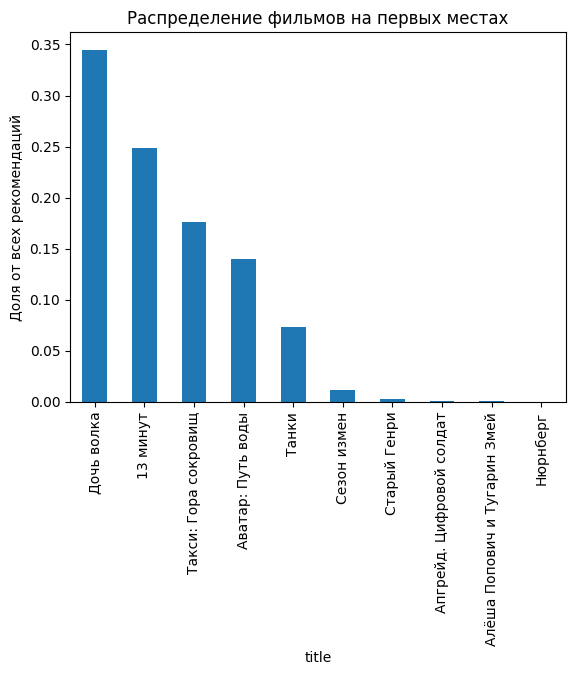

In [90]:
first_items = pd.DataFrame([x[0] for x in test_part["implicit_als_recs"].values], columns=["id"])
first_items = (
    first_items.merge(items_df[["id", "title"]], on="id").groupby("title").size().sort_values(ascending=False)
)
first_items /= first_items.sum()
first_items.head(10).plot(kind="bar")
plt.ylabel("Доля от всех рекомендаций")
plt.title("Распределение фильмов на первых местах")
plt.show()


#### "Аватар: Путь воды" уже не на первом месте, но можем заметить, что в топе он все еще остается


#### Посмотрим на похожие фильмы к фильму "Дочь волка", согласно новому als

In [91]:
items_df[items_df["title"] == 'Дочь волка']

,id,title,year,date_publication,description,genres,countries,staff,title_orig,age_rating,keywords
5849,5849,Дочь волка,2019-01-01,2023-04-01T00:00:00,Клэр возвращается домой из поездки по Ближнему...,"[85, 294]",[121],"[4378, 5332, 16814, 7345, 20828, 28334, 14294,...",Daughter of the Wolf,18.0,"2019, канада, дочь, волка"


In [92]:
def get_similar_films(title, N=10):
    item_id = items_df[items_df["title"] == title]['id'].values[0]

    similar_encoded_ids = als_rec.model.similar_items(
        als_rec.item_encoder.transform([item_id]), N=N, filter_items=als_rec.item_encoder.transform([item_id])
    )[0][0]
    similar_ids = als_rec.item_encoder.inverse_transform(similar_encoded_ids)   
    return items_df[items_df["id"].isin(similar_ids)]["title"]

In [93]:
get_similar_films("Дочь волка")

1177                         Пограничный пес Алый
1182                                     Район №9
1187                  Чип и Дейл спешат на помощь
1746                                  Самогонщики
2755                      Ну разве не романтично?
2870    Индиана Джонс и Последний крестовый поход
3061                               Эволюция Борна
5928                                Высокая горка
6617                      Хэллоуин: 20 лет спустя
6927                        Ничего себе поездочка
Name: title, dtype: object

#### Набор кажется неплохим, хотя даже мультик про грызунов затесался среди похожих. Теперь предлагается сравнить результаты для "Аватар: Путь воды"

In [94]:
get_similar_films("Аватар: Путь воды")

116                            Элвин и бурундуки 2
1168                                  Адская кухня
1350                  Гарри Поттер и Орден Феникса
1547                                  Интерстеллар
1709    Великие битвы Курская Дуга «Огненная дуга»
3738                             Призрачный гонщик
3900                                          Игра
4241                      АЭРОПЧЕЛА — «Не забывай»
5151                       Выйти замуж за капитана
5652                                 Мне не больно
Name: title, dtype: object

#### Получается, что после добавления распределения по жанрам и годам 31 июня уже нет, но появились абсолютно новые фильмы, так что есть основания полагать, что у нас выходит действительно новый результат, несмотря на незначительный прирост в метрике

### Проверим, как система справляется с учетом жанра и года выпуска, заодно узнаем, есть ли перекос по весам

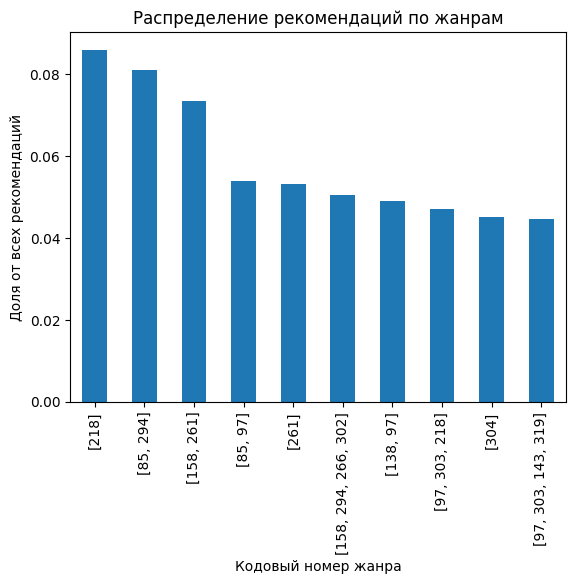

In [95]:
genre_distribution = test_part.explode("implicit_als_recs").merge(items_df[["id", "genres"]], left_on="implicit_als_recs", right_on="id")
genre_distribution['genres'].value_counts(normalize=True).head(10).plot(kind="bar")

plt.ylabel("Доля от всех рекомендаций")
plt.xlabel("Кодовый номер жанра")
plt.title("Распределение рекомендаций по жанрам")
plt.show()


### Сильного перекоса в рекомендации жанров нет, поэтому можно считать, что в этом плане сильной предвзятости у системы нет

### Теперь проверим наличие предвзятости по новизне фильмов. Она должна быть, поскольку изначально предпологалось отдавать предпочтение новинкам

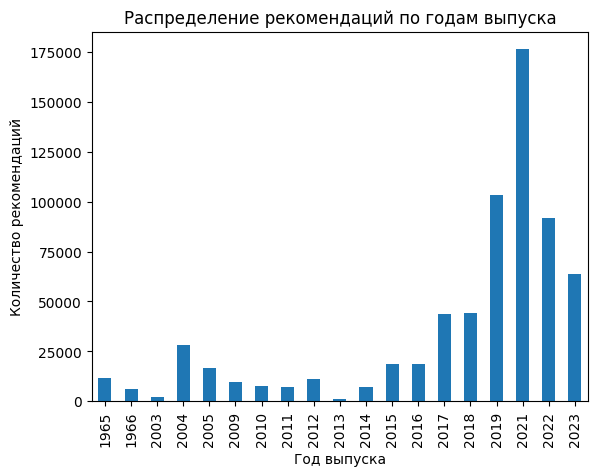

In [96]:
items_df['year'] = pd.to_datetime(items_df['year']).dt.year

year_distribution = test_part.explode("implicit_als_recs").merge(items_df[["id", "year"]], left_on="implicit_als_recs", right_on="id")
year_distribution['year'].value_counts().sort_index().plot(kind="bar")

plt.ylabel("Количество рекомендаций")
plt.xlabel("Год выпуска")
plt.title("Распределение рекомендаций по годам выпуска")
plt.show()


### Результат соответствует ожиданиям, но есть основания полагать, что перекос слишком сильный и стоило бы его сгладить

### Поскольку для рекомендательной системы важно не превращаться в пузырь, то имеет смысл провести анализ новизны рекомендаций

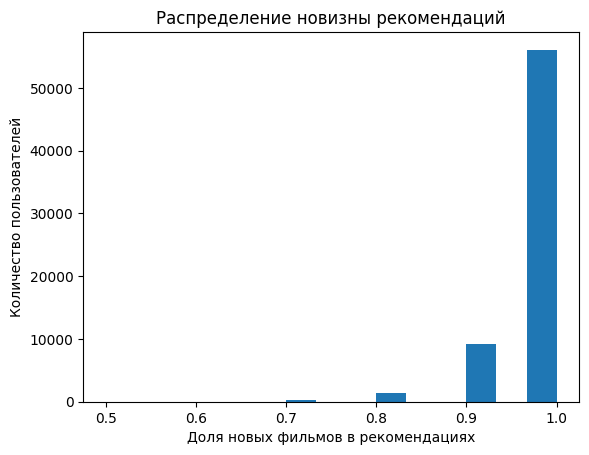

In [97]:
novelty_score = test_part.apply(lambda row: len(set(row['implicit_als_recs']) - set(row['movie_id'])) / len(row['implicit_als_recs']), axis=1)

plt.hist(novelty_score, bins=15)
plt.xlabel("Доля новых фильмов в рекомендациях")
plt.ylabel("Количество пользователей")
plt.title("Распределение новизны рекомендаций")
plt.show()


### Видим, что система с этим отлично справляется и уже просмотренные пользователем фильмы не рекомендует, но вполне возможно, что это из-за выборки, которая охватывает относительно малый промежуток времени, так что гарантий не замкнуться на дистанции нет.